# Follow-Me Project
Congratulations on reaching the final project of the Robotics Nanodegree! 

Previously, you worked on the Semantic Segmentation lab where you built a deep learning network that locates a particular human target within an image. For this project, you will utilize what you implemented and learned from that lab and extend it to train a deep learning model that will allow a simulated quadcopter to follow around the person that it detects! 

Most of the code below is similar to the lab with some minor modifications. You can start with your existing solution, and modify and improve upon it to train the best possible model for this task.

You can click on any of the following to quickly jump to that part of this notebook:
1. [Data Collection](#data)
2. [FCN Layers](#fcn)
3. [Build the Model](#build)
4. [Training](#training)
5. [Prediction](#prediction)
6. [Evaluation](#evaluation)

## Data Collection<a id='data'></a>
We have provided you with a starting dataset for this project. Download instructions can be found in the README for this project's repo.
Alternatively, you can collect additional data of your own to improve your model. Check out the "Collecting Data" section in the Project Lesson in the Classroom for more details!

In [4]:
import os
import glob
import sys
import tensorflow as tf

from scipy import misc
import numpy as np

from tensorflow.contrib.keras.python import keras
from tensorflow.contrib.keras.python.keras import layers, models

from tensorflow import image

from utils import scoring_utils
from utils.separable_conv2d import SeparableConv2DKeras, BilinearUpSampling2D
from utils import data_iterator
from utils import plotting_tools 
from utils import model_tools

## FCN Layers <a id='fcn'></a>
In the Classroom, we discussed the different layers that constitute a fully convolutional network (FCN). The following code will introduce you to the functions that you need to build your semantic segmentation model.

### Separable Convolutions
The Encoder for your FCN will essentially require separable convolution layers, due to their advantages as explained in the classroom. The 1x1 convolution layer in the FCN, however, is a regular convolution. Implementations for both are provided below for your use. Each includes batch normalization with the ReLU activation function applied to the layers. 

In [5]:
def separable_conv2d_batchnorm(input_layer, filters, strides=1):
    output_layer = SeparableConv2DKeras(filters=filters,kernel_size=3, strides=strides,
                             padding='same', activation='relu')(input_layer)
    
    output_layer = layers.BatchNormalization()(output_layer) 
    return output_layer

def conv2d_batchnorm(input_layer, filters, kernel_size=3, strides=1):
    output_layer = layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, 
                      padding='same', activation='relu')(input_layer)
    
    output_layer = layers.BatchNormalization()(output_layer) 
    return output_layer

### Bilinear Upsampling
The following helper function implements the bilinear upsampling layer. Upsampling by a factor of 2 is generally recommended, but you can try out different factors as well. Upsampling is used in the decoder block of the FCN.

In [6]:
def bilinear_upsample(input_layer):
    output_layer = BilinearUpSampling2D((2,2))(input_layer)
    return output_layer

## Build the Model <a id='build'></a>
In the following cells, you will build an FCN to train a model to detect and locate the hero target within an image. The steps are:
- Create an `encoder_block`
- Create a `decoder_block`
- Build the FCN consisting of encoder block(s), a 1x1 convolution, and decoder block(s).  This step requires experimentation with different numbers of layers and filter sizes to build your model.

### Encoder Block
Create an encoder block that includes a separable convolution layer using the `separable_conv2d_batchnorm()` function. The `filters` parameter defines the size or depth of the output layer. For example, 32 or 64. 

In [7]:
def encoder_block(input_layer, filters, strides):
    
    # TODO Create a separable convolution layer using the separable_conv2d_batchnorm() function.
    output_layer = separable_conv2d_batchnorm(input_layer, filters, strides)
    
    return output_layer

### Decoder Block
The decoder block is comprised of three parts:
- A bilinear upsampling layer using the upsample_bilinear() function. The current recommended factor for upsampling is set to 2.
- A layer concatenation step. This step is similar to skip connections. You will concatenate the upsampled small_ip_layer and the large_ip_layer.
- Some (one or two) additional separable convolution layers to extract some more spatial information from prior layers.

In [8]:
def decoder_block(small_ip_layer, large_ip_layer, filters):
    
    # TODO Upsample the small input layer using the bilinear_upsample() function.
    small_ip_layer_upsampled = bilinear_upsample(small_ip_layer)
    
    # TODO Concatenate the upsampled and large input layers using layers.concatenate
    output_layer = layers.concatenate([small_ip_layer_upsampled, large_ip_layer])
    
    # TODO Add some number of separable convolution layers
    output_layer = separable_conv2d_batchnorm(output_layer, filters, strides=1)
    output_layer = separable_conv2d_batchnorm(output_layer, filters, strides=1)
    
    return output_layer

### Model

Now that you have the encoder and decoder blocks ready, go ahead and build your FCN architecture! 

There are three steps:
- Add encoder blocks to build the encoder layers. This is similar to how you added regular convolutional layers in your CNN lab.
- Add a 1x1 Convolution layer using the conv2d_batchnorm() function. Remember that 1x1 Convolutions require a kernel and stride of 1.
- Add decoder blocks for the decoder layers.

In [9]:
def fcn_model(inputs, num_classes):
    
    # TODO Add Encoder Blocks. 
    # Remember that with each encoder layer, the depth of your model (the number of filters) increases.
    encoder_layer1 = encoder_block(inputs, filters=32, strides=2)
    encoder_layer2 = encoder_block(encoder_layer1, filters=64, strides=2)

    # TODO Add 1x1 Convolution layer using conv2d_batchnorm().
    encoder_layer3 = conv2d_batchnorm(encoder_layer2, filters=128, kernel_size=1, strides=1)
    
    # TODO: Add the same number of Decoder Blocks as the number of Encoder Blocks
    decoder_layer1 = decoder_block(encoder_layer3, encoder_layer1, filters=64)
    decoder_layer2 = decoder_block(decoder_layer1, inputs, filters=32)
    
    x = decoder_layer2
    
    # The function returns the output layer of your model. "x" is the final layer obtained from the last decoder_block()
    return layers.Conv2D(num_classes, 3, activation='softmax', padding='same')(x)

## Training <a id='training'></a>
The following cells will use the FCN you created and define an ouput layer based on the size of the processed image and the number of classes recognized. You will define the hyperparameters to compile and train your model.

Please Note: For this project, the helper code in `data_iterator.py` will resize the copter images to 160x160x3 to speed up training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""

image_hw = 160
image_shape = (image_hw, image_hw, 3)
inputs = layers.Input(image_shape)
num_classes = 3

# Call fcn_model()
output_layer = fcn_model(inputs, num_classes)

### Hyperparameters
Define and tune your hyperparameters.
- **batch_size**: number of training samples/images that get propagated through the network in a single pass.
- **num_epochs**: number of times the entire training dataset gets propagated through the network.
- **steps_per_epoch**: number of batches of training images that go through the network in 1 epoch. We have provided you with a default value. One recommended value to try would be based on the total number of images in training dataset divided by the batch_size.
- **validation_steps**: number of batches of validation images that go through the network in 1 epoch. This is similar to steps_per_epoch, except validation_steps is for the validation dataset. We have provided you with a default value for this as well.
- **workers**: maximum number of processes to spin up. This can affect your training speed and is dependent on your hardware. We have provided a recommended value to work with. 

In [11]:
learning_rate = 0.001
batch_size = 64
num_epochs = 10
steps_per_epoch = 220
validation_steps = 50
workers = 2

The following cell will add a learning rate scheduler to reduce the learning rate by a factor of 0.5 every (step) epochs.

In [9]:
# create learning rate scheduler, save model and output results
def schedule(epoch):
    # change learning rate every (step) epochs, minimum learning rate = 0.001
    initialLearningRate = 0.001
    step = 1 
    if not int(epoch/step):
        lr = initialLearningRate
    else:
        lr = initialLearningRate * (0.5**int(epoch/step)) # or: new lr = old lr * 0.5
        if lr < 0.001:
            lr = 0.001
    print ("learning rate: ", lr)
    
    if epoch:
        # Save your trained model weights
        weight_file_name = 'model_weights_epoch' + str(epoch)
        model_tools.save_network(model, weight_file_name)
        print ("weights saved")

        # show results
        run_num = 'run_1'

        val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                                run_num,'patrol_with_targ', 'sample_evaluation_data') 

        val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                                run_num,'patrol_non_targ', 'sample_evaluation_data') 

        val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                                run_num,'following_images', 'sample_evaluation_data')

        # images while following the target
        im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
        for i in range(2):
            im_tuple = plotting_tools.load_images(im_files[i])
            plotting_tools.show_images(im_tuple)


        # images while at patrol without target
        im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
        for i in range(2):
            im_tuple = plotting_tools.load_images(im_files[i])
            plotting_tools.show_images(im_tuple)


        # images while at patrol with target
        im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
        for i in range(2):
            im_tuple = plotting_tools.load_images(im_files[i])
            plotting_tools.show_images(im_tuple)

        # Scores for while the quad is following behind the target. 
        true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)
        print("iou1: ", iou1)

        # Scores for images while the quad is on patrol and the target is not visable
        true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)
        print("iou2: ", iou2)

        # This score measures how well the neural network can detect the target from far away
        true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)
        print("iou3: ", iou3)

        # Sum all the true positives, etc from the three datasets to get a weight for the score
        true_pos = true_pos1 + true_pos2 + true_pos3
        false_pos = false_pos1 + false_pos2 + false_pos3
        false_neg = false_neg1 + false_neg2 + false_neg3

        weight = true_pos/(true_pos+false_neg+false_pos)
        print("weight: ", weight)

        # The IoU for the dataset that never includes the hero is excluded from grading
        final_IoU = (iou1 + iou3)/2
        print("final_IoU: ", final_IoU)

        # And the final grade score is 
        final_score = final_IoU * weight
        print("final_score: ", final_score)
    
    
    return float(lr)

from tensorflow.contrib.keras.python.keras.callbacks import LearningRateScheduler
LRScheduler = LearningRateScheduler(schedule=schedule)

learning rate:  0.001
Epoch 1/10
219/220 [============================>.] - ETA: 50s - loss: 0.3139 

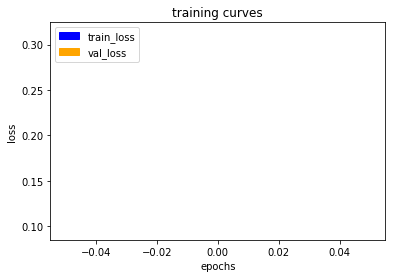

220/220 [==============================] - 11722s - loss: 0.3127 - val_loss: 0.0958
learning rate:  0.001
weights saved


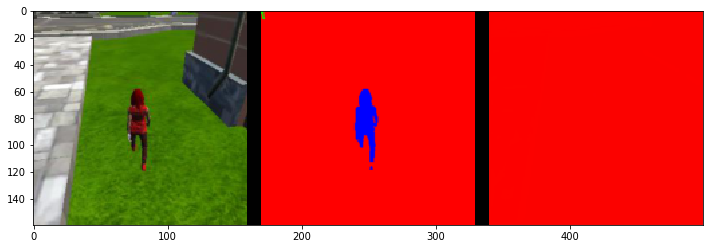

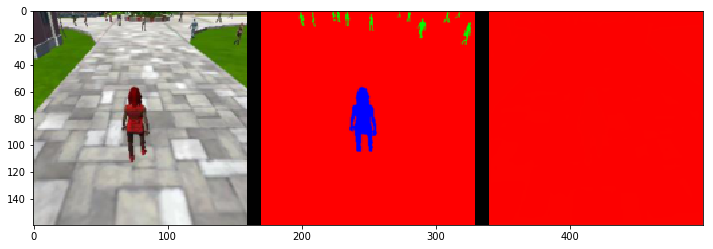

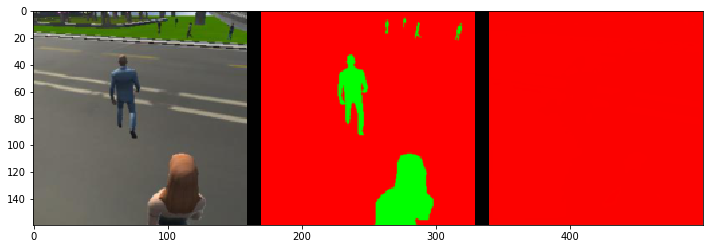

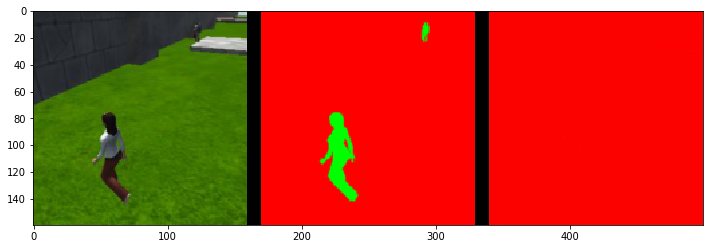

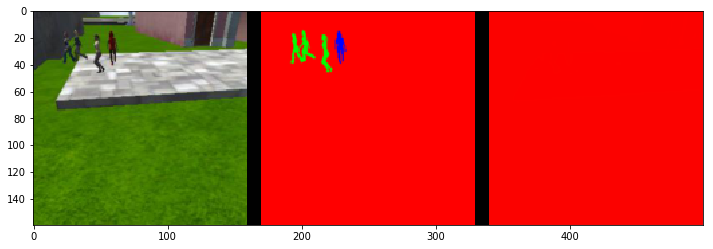

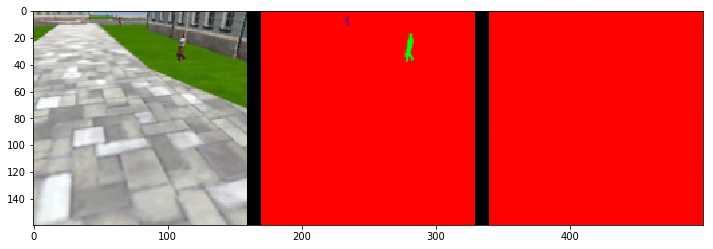

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9719131976476029
average intersection over union for other people is 0.0
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 0, number false negatives: 539
iou1:  0.0
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.954649016203703
average intersection over union for other people is 0.0
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 0, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9897817595108703
average intersection over union for other people is 0.0
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 0, number false 

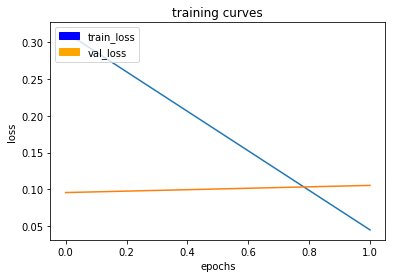

220/220 [==============================] - 11672s - loss: 0.0450 - val_loss: 0.1055
learning rate:  0.001
weights saved


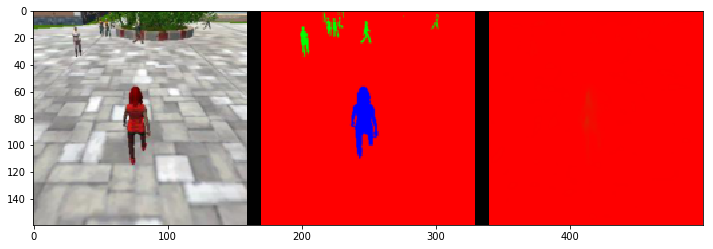

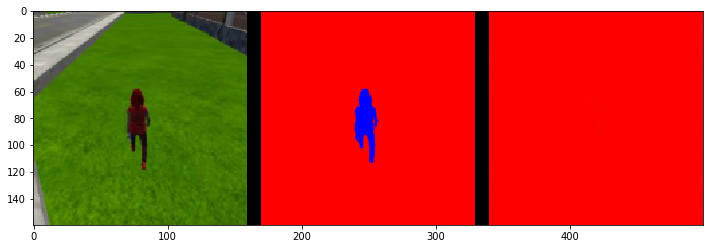

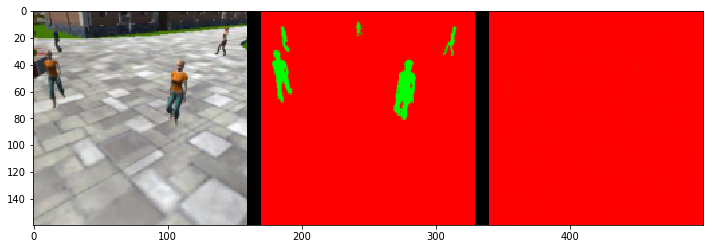

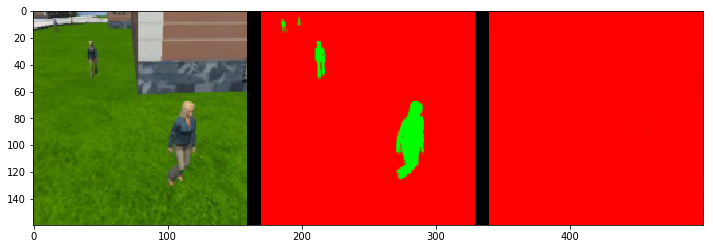

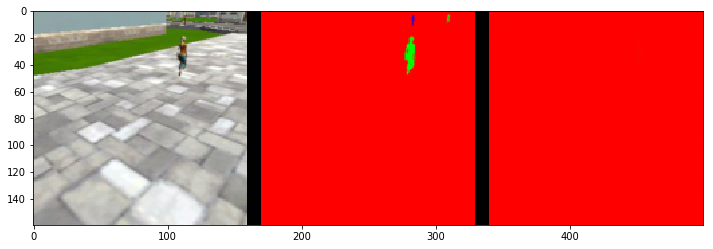

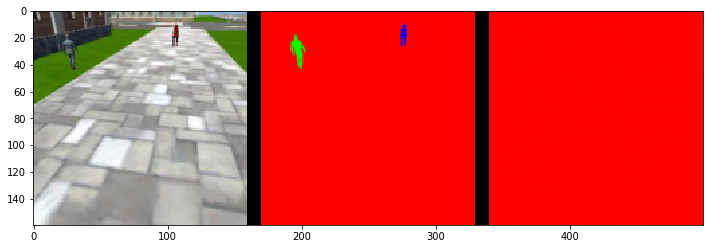

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9719131976476029
average intersection over union for other people is 0.0
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 0, number false negatives: 539
iou1:  0.0
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.954649016203703
average intersection over union for other people is 0.0
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 0, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9897817595108703
average intersection over union for other people is 0.0
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 0, number false 

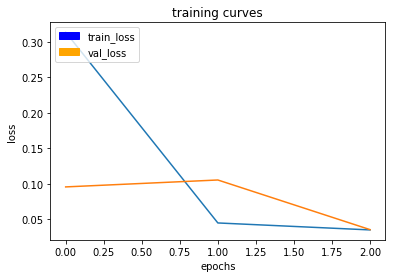

220/220 [==============================] - 11688s - loss: 0.0352 - val_loss: 0.0356
learning rate:  0.001
weights saved


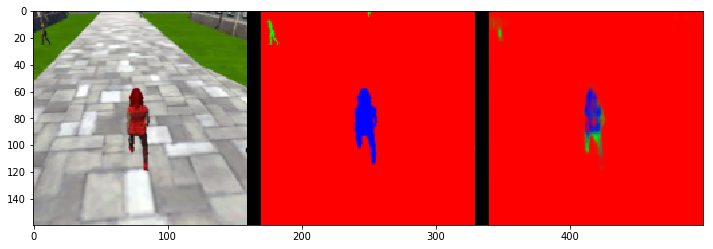

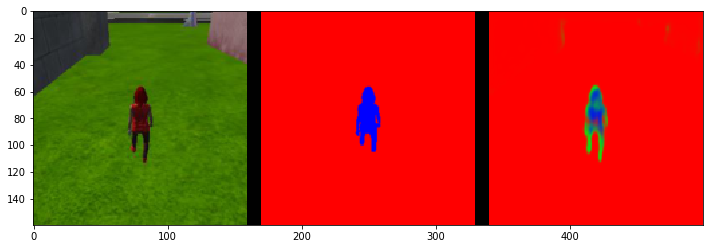

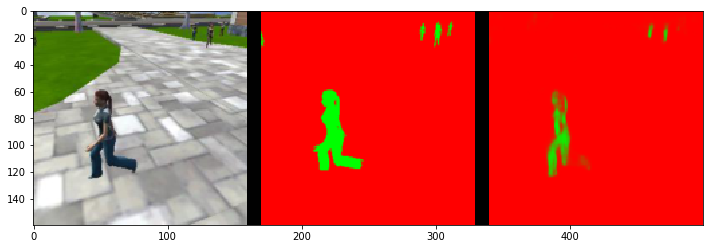

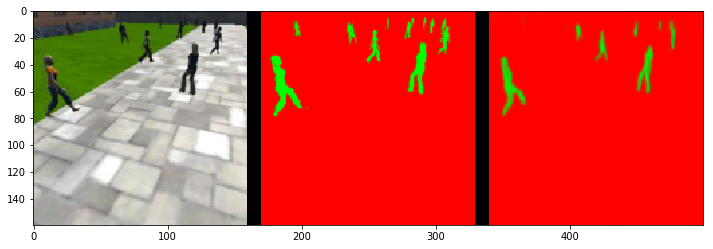

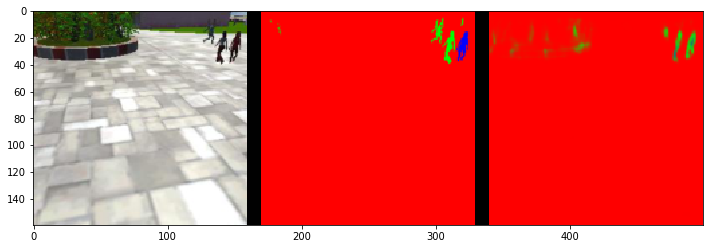

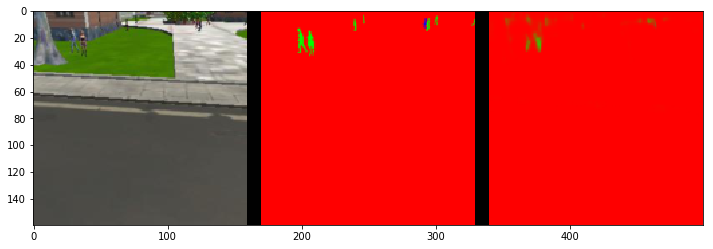

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9882371010613636
average intersection over union for other people is 0.08182942636240671
average intersection over union for the hero is 0.3449268160101519
number true positives: 512, number false positives: 0, number false negatives: 27
iou1:  0.34492681601
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9699209710402211
average intersection over union for other people is 0.3589314296575725
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 3, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9922107400137469
average intersection over union for other people is 0.15122563282760576
average intersection over union for the hero

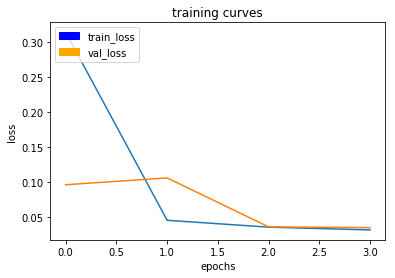

220/220 [==============================] - 11987s - loss: 0.0312 - val_loss: 0.0345
learning rate:  0.001
weights saved


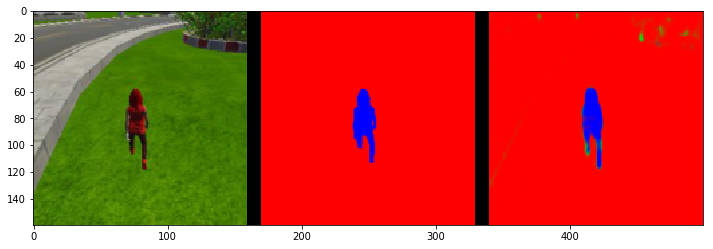

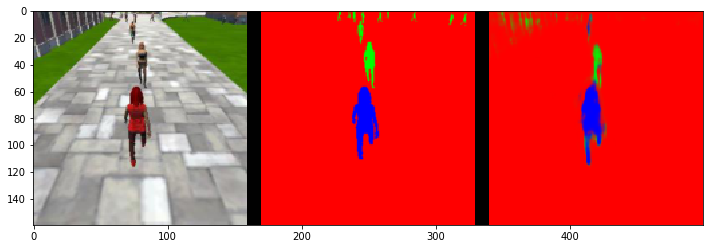

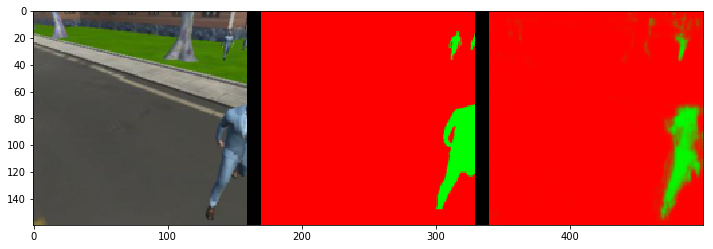

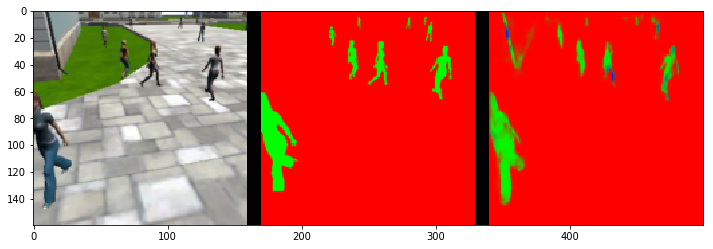

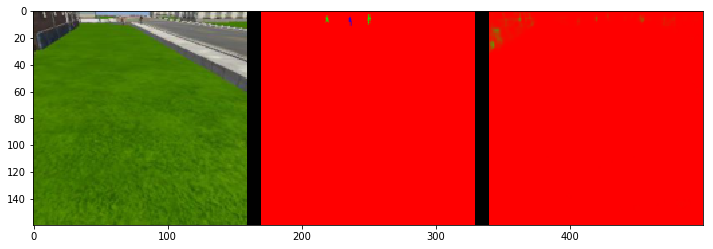

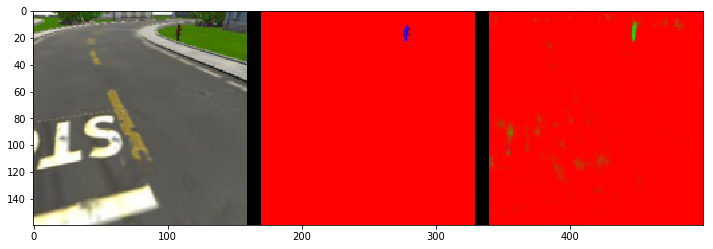

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9884651558298049
average intersection over union for other people is 0.1762151495562684
average intersection over union for the hero is 0.7384228535656708
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.738422853566
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9787675498315574
average intersection over union for other people is 0.5658078826972425
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 129, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9904705151884544
average intersection over union for other people is 0.23341445834610516
average intersection over union for the her

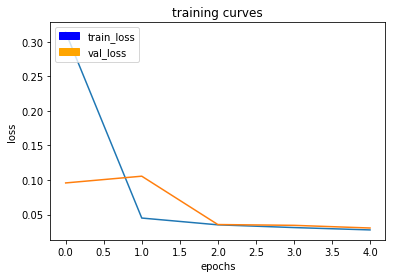

220/220 [==============================] - 11727s - loss: 0.0279 - val_loss: 0.0306
learning rate:  0.001
weights saved


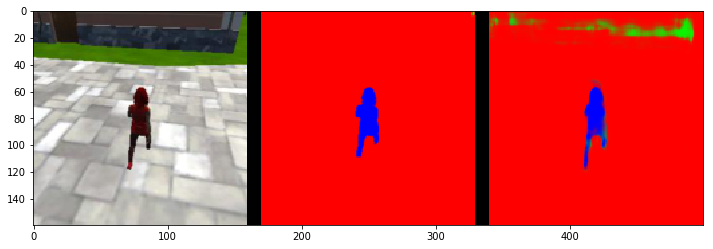

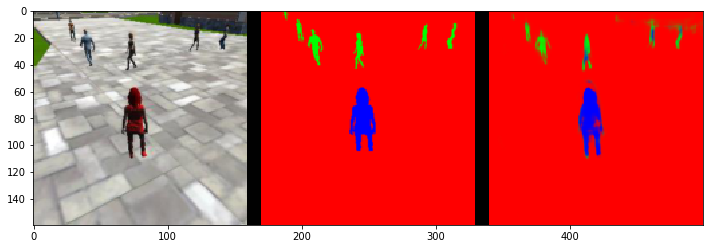

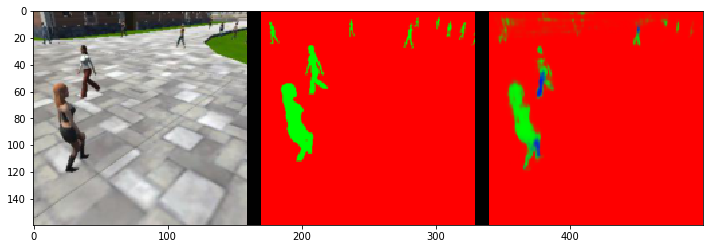

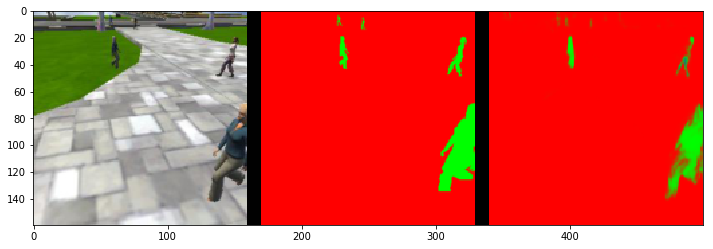

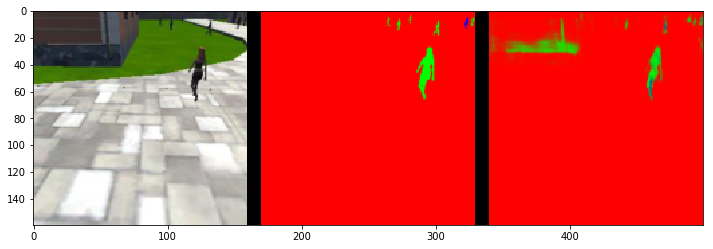

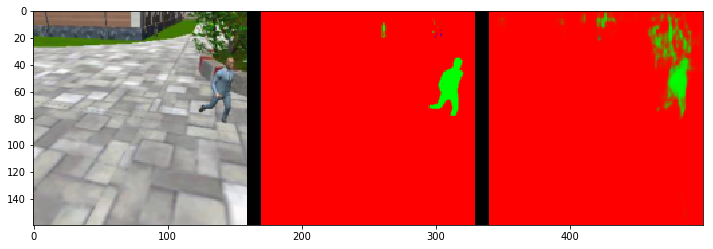

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9881584325589129
average intersection over union for other people is 0.20571531126645923
average intersection over union for the hero is 0.8000372648436657
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.800037264844
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9782426186759323
average intersection over union for other people is 0.5985532709631032
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 153, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9877197740138878
average intersection over union for other people is 0.24574755589456526
average intersection over union for the he

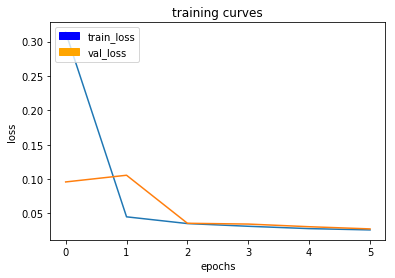

220/220 [==============================] - 11721s - loss: 0.0259 - val_loss: 0.0274
learning rate:  0.001
weights saved


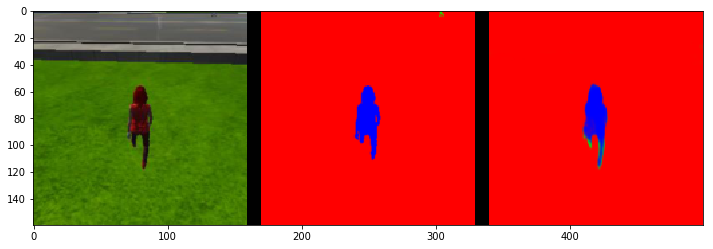

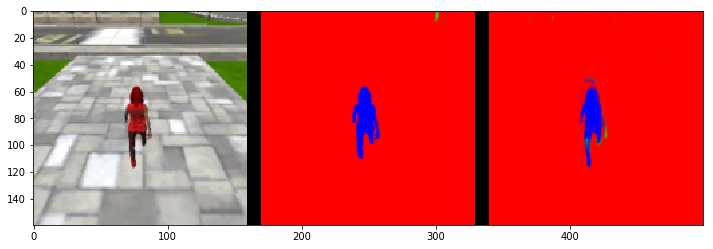

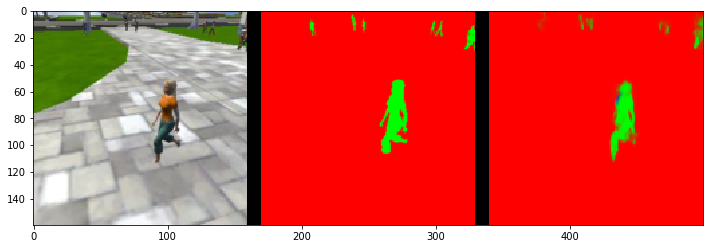

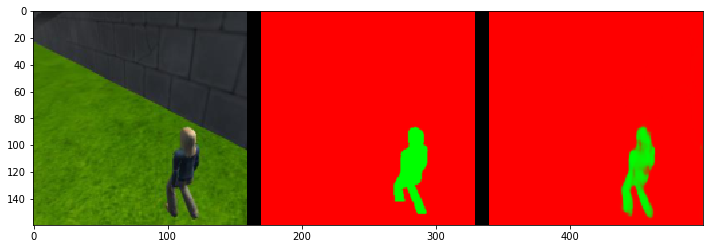

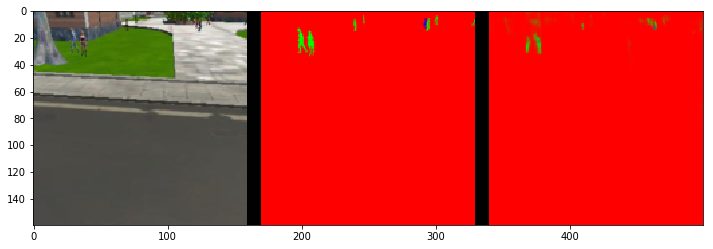

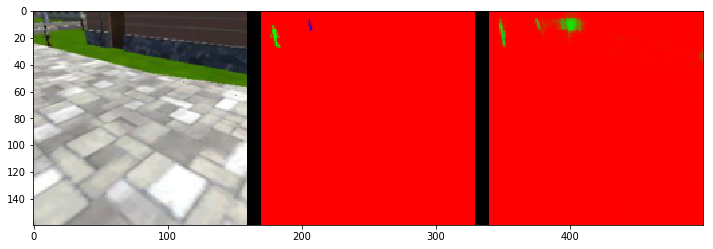

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9902665950059857
average intersection over union for other people is 0.21893916663407118
average intersection over union for the hero is 0.7862732502412552
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.786273250241
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9805951078851717
average intersection over union for other people is 0.6223382089037913
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 117, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9916775858803897
average intersection over union for other people is 0.27948641509515004
average intersection over union for the he

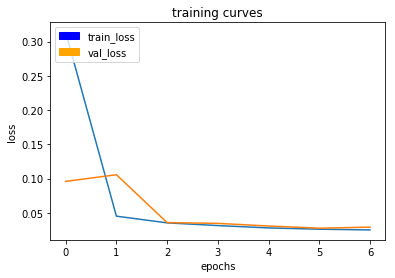

220/220 [==============================] - 11794s - loss: 0.0250 - val_loss: 0.0290
learning rate:  0.001
weights saved


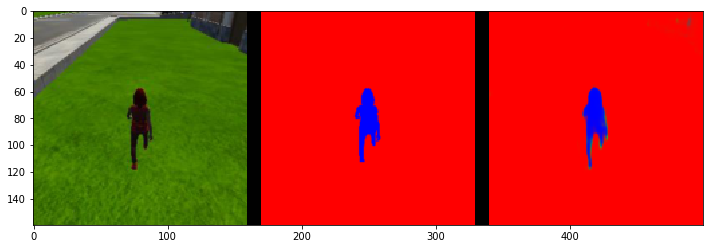

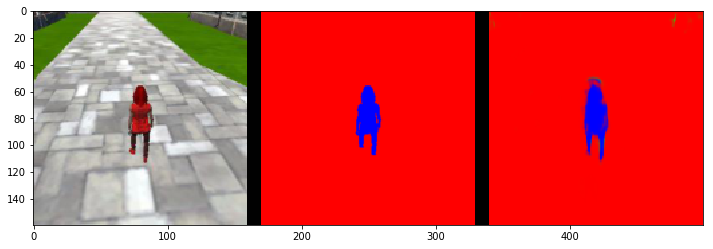

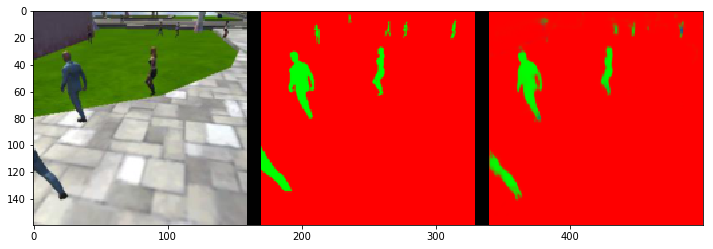

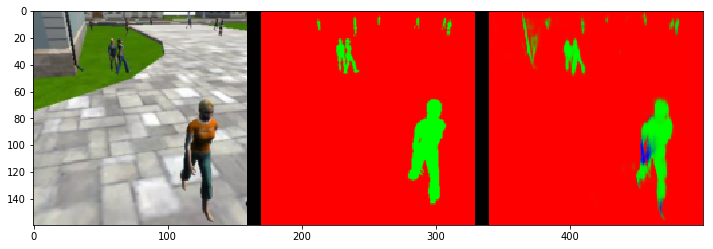

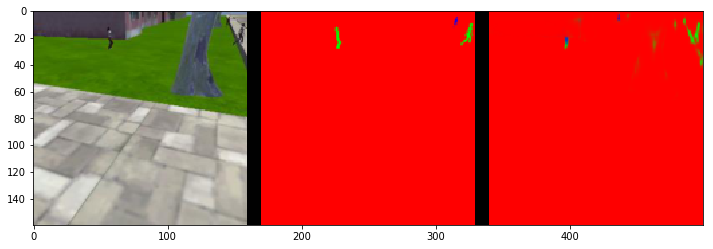

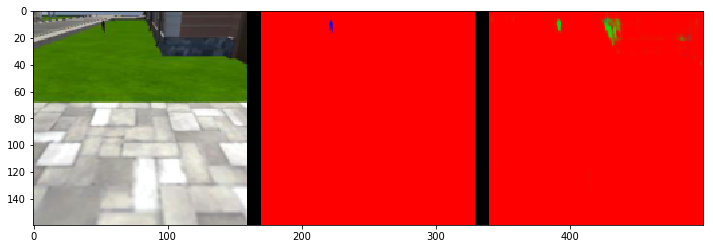

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9903082854627557
average intersection over union for other people is 0.2428472113030381
average intersection over union for the hero is 0.8188480667011241
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.818848066701
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.981971343082836
average intersection over union for other people is 0.6377350301882475
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 153, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9915384645285539
average intersection over union for other people is 0.30703035963157477
average intersection over union for the hero

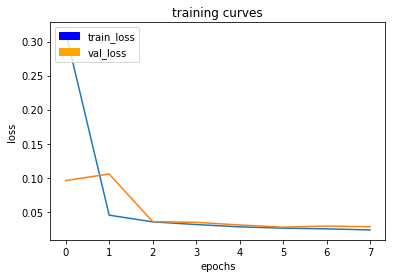

220/220 [==============================] - 11939s - loss: 0.0233 - val_loss: 0.0281
learning rate:  0.001
weights saved


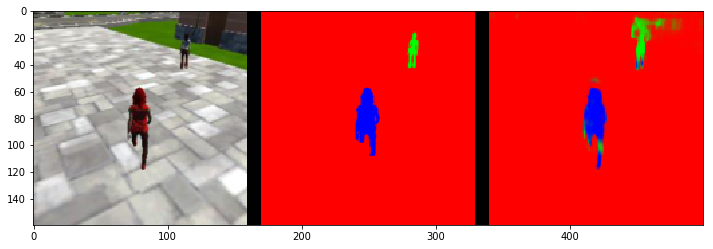

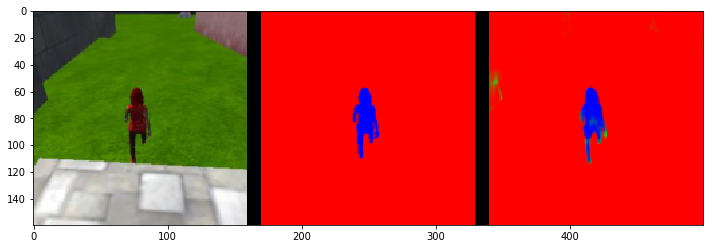

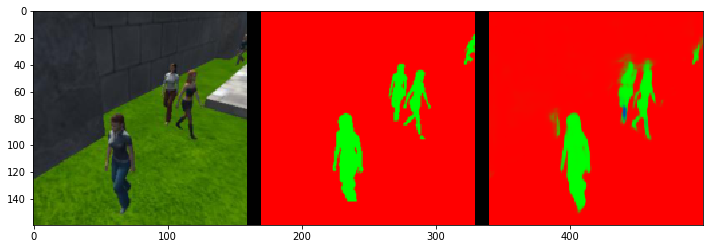

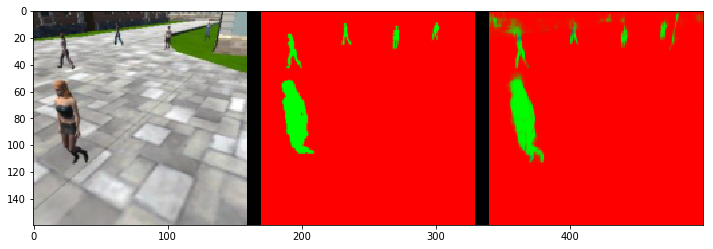

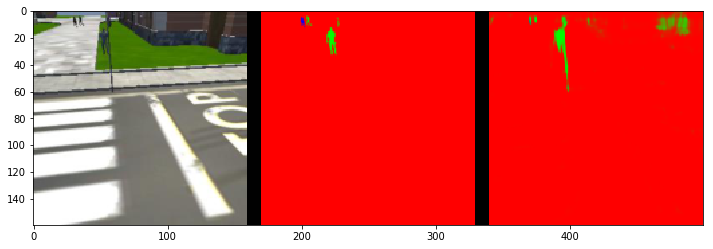

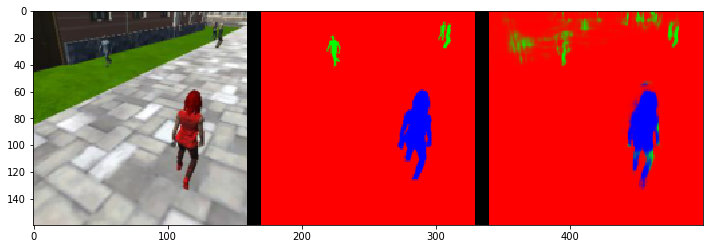

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9884420268378793
average intersection over union for other people is 0.23149542533498046
average intersection over union for the hero is 0.7761108001374422
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.776110800137
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9803916825955711
average intersection over union for other people is 0.6867250377233797
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 66, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9876971910638381
average intersection over union for other people is 0.2876256740476693
average intersection over union for the hero

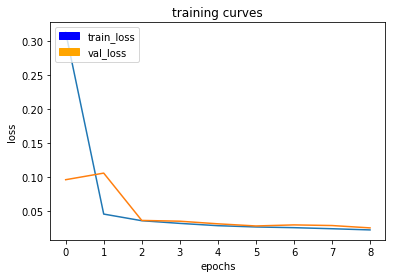

220/220 [==============================] - 11727s - loss: 0.0216 - val_loss: 0.0246
learning rate:  0.001
weights saved


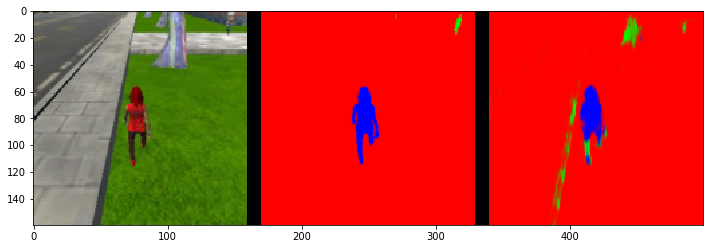

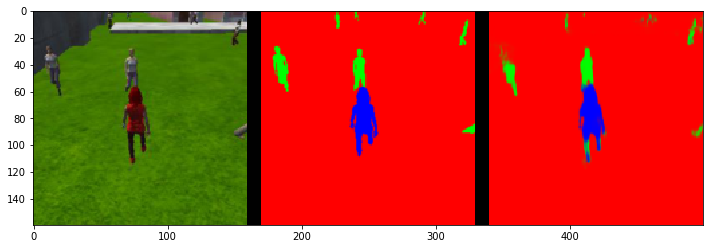

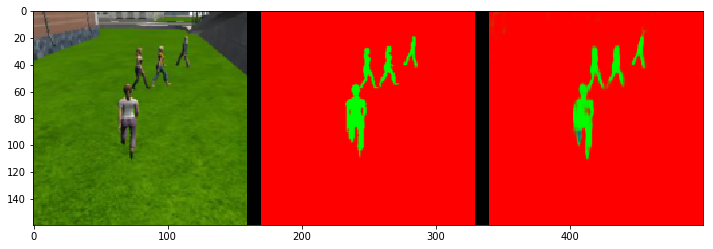

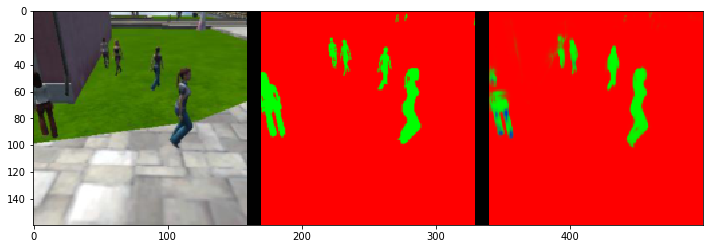

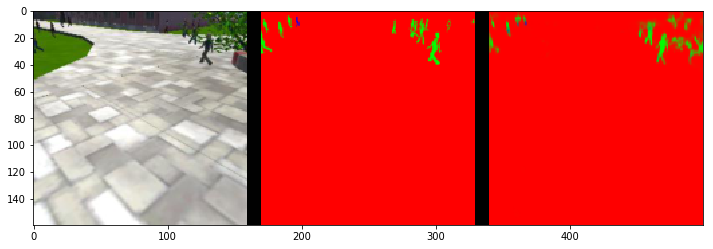

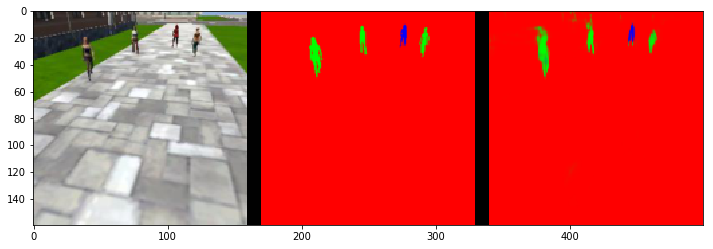

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9911018603119205
average intersection over union for other people is 0.2512596329337969
average intersection over union for the hero is 0.8146274324803121
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.81462743248
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9830544875228807
average intersection over union for other people is 0.6668244642611502
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 110, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9928780018616067
average intersection over union for other people is 0.3341758123552526
average intersection over union for the hero 

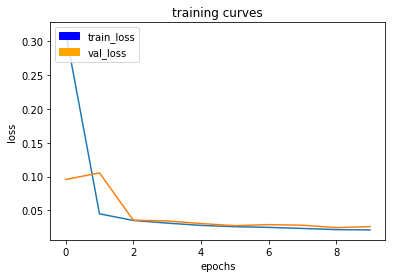

220/220 [==============================] - 11737s - loss: 0.0212 - val_loss: 0.0260


In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
model = models.Model(inputs=inputs, outputs=output_layer)
model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data


train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb, LRScheduler]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [11]:
# Save your trained model weights
weight_file_name = 'model_weights_final'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [12]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

#weight_file_name = 'model_weights'
#model = model_tools.load_network(weight_file_name)

The following cell will write predictions to files and return paths to the appropriate directories.
The `run_num` parameter is used to define or group all the data for a particular model run. You can change it for different runs. For example, 'run_1', 'run_2' etc.

In [13]:
run_num = 'run_2'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

Now lets look at your predictions, and compare them to the ground truth labels and original images.
Run each of the following cells to visualize some sample images from the predictions in the validation set.

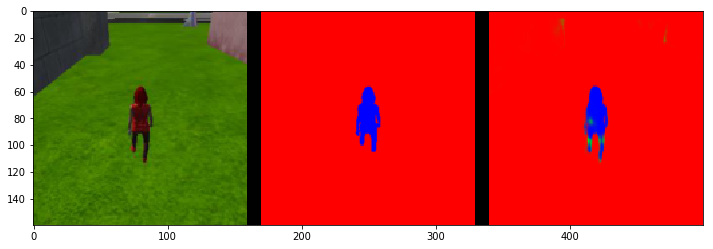

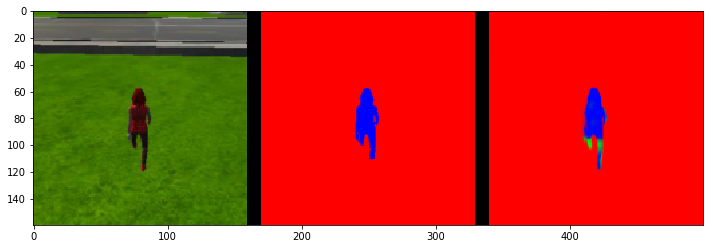

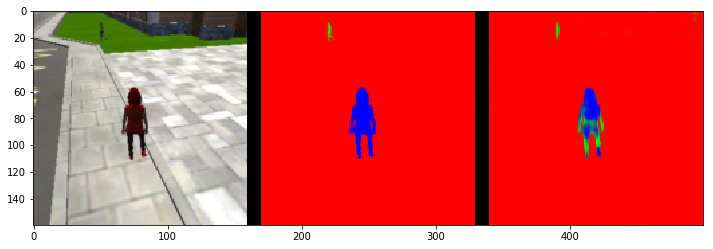

In [14]:
# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

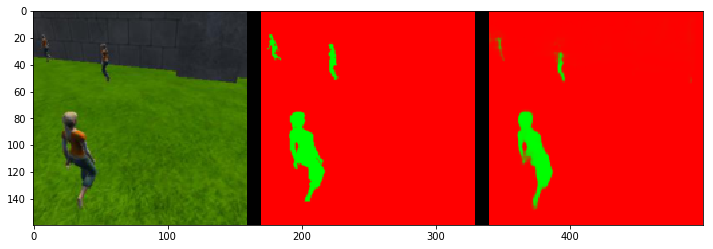

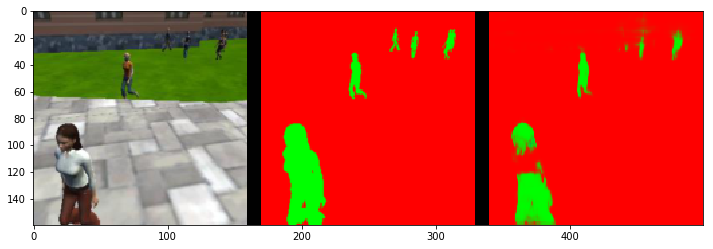

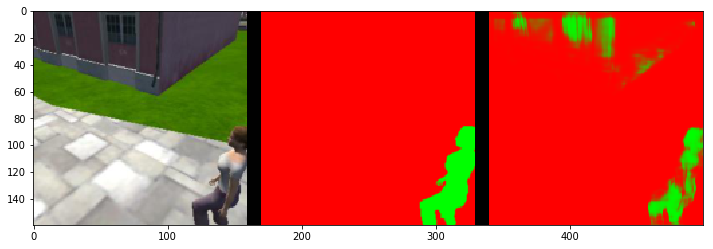

In [15]:
# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

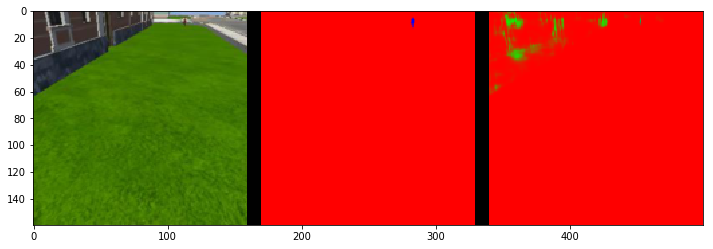

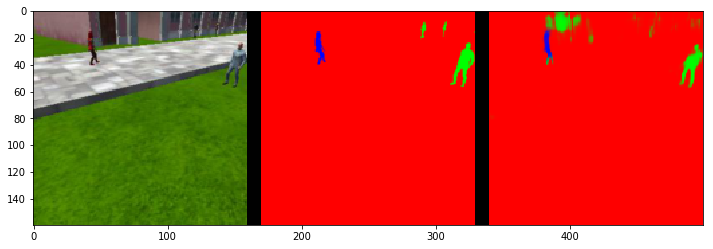

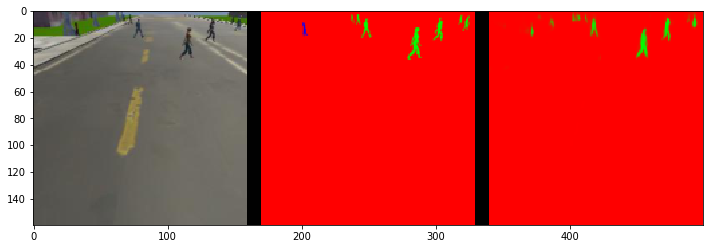

In [16]:
   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)

## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [17]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)
print("iou1: ", iou1)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9906866301089717
average intersection over union for other people is 0.22409681587535596
average intersection over union for the hero is 0.7385404159207609
number true positives: 538, number false positives: 0, number false negatives: 1
iou1:  0.738540415921


In [18]:
# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)
print("iou2: ", iou2)

number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9824887923183534
average intersection over union for other people is 0.6857381629847203
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 24, number false negatives: 0
iou2:  0.0


In [19]:
# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)
print("iou3: ", iou3)

number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9911960488152907
average intersection over union for other people is 0.3121489560484569
average intersection over union for the hero is 0.18206433870765712
number true positives: 135, number false positives: 4, number false negatives: 166
iou3:  0.182064338708


In [20]:
# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print(weight)

0.7753456221198156


In [21]:
# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print(final_IoU)

0.460302377314


In [22]:
# And the final grade score is 
final_score = final_IoU * weight
print(final_score)

0.356893433102


## Load the Best Model And Continue Training
Use the model at epoch 9 with a final score of 3.99 and continue training.

### Hyperparameters
Define and tune your hyperparameters.
- **batch_size**: number of training samples/images that get propagated through the network in a single pass.
- **num_epochs**: number of times the entire training dataset gets propagated through the network.
- **steps_per_epoch**: number of batches of training images that go through the network in 1 epoch. We have provided you with a default value. One recommended value to try would be based on the total number of images in training dataset divided by the batch_size.
- **validation_steps**: number of batches of validation images that go through the network in 1 epoch. This is similar to steps_per_epoch, except validation_steps is for the validation dataset. We have provided you with a default value for this as well.
- **workers**: maximum number of processes to spin up. This can affect your training speed and is dependent on your hardware. We have provided a recommended value to work with. 

In [15]:
learning_rate = 0.001
batch_size = 64
num_epochs = 10
steps_per_epoch = 220
validation_steps = 50
workers = 2

The following cell will add a learning rate scheduler to reduce the learning rate by a factor of 0.5 every (step) epochs.
set minimum learning rate to 0.0005, step = 3.

In [16]:
# create learning rate scheduler, save model and output results
def schedule(epoch):
    # change learning rate every (step) epochs, minimum learning rate = 0.001
    initialLearningRate = 0.001
    step = 3 
    if not int(epoch/step):
        lr = initialLearningRate
    else:
        lr = initialLearningRate * (0.5**int(epoch/step)) # or: new lr = old lr * 0.5
        if lr < 0.0005:
            lr = 0.0005
    print ("learning rate: ", lr)
    
    if epoch:
        # Save your trained model weights
        weight_file_name = 'model_weights_b_epoch' + str(epoch)
        model_tools.save_network(model, weight_file_name)
        print ("weights saved")

        # show results
        run_num = 'run_1'

        val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                                run_num,'patrol_with_targ', 'sample_evaluation_data') 

        val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                                run_num,'patrol_non_targ', 'sample_evaluation_data') 

        val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                                run_num,'following_images', 'sample_evaluation_data')

        # images while following the target
        im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
        for i in range(2):
            im_tuple = plotting_tools.load_images(im_files[i])
            plotting_tools.show_images(im_tuple)


        # images while at patrol without target
        im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
        for i in range(2):
            im_tuple = plotting_tools.load_images(im_files[i])
            plotting_tools.show_images(im_tuple)


        # images while at patrol with target
        im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
        for i in range(2):
            im_tuple = plotting_tools.load_images(im_files[i])
            plotting_tools.show_images(im_tuple)

        # Scores for while the quad is following behind the target. 
        true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)
        print("iou1: ", iou1)

        # Scores for images while the quad is on patrol and the target is not visable
        true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)
        print("iou2: ", iou2)

        # This score measures how well the neural network can detect the target from far away
        true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)
        print("iou3: ", iou3)

        # Sum all the true positives, etc from the three datasets to get a weight for the score
        true_pos = true_pos1 + true_pos2 + true_pos3
        false_pos = false_pos1 + false_pos2 + false_pos3
        false_neg = false_neg1 + false_neg2 + false_neg3

        weight = true_pos/(true_pos+false_neg+false_pos)
        print("weight: ", weight)

        # The IoU for the dataset that never includes the hero is excluded from grading
        final_IoU = (iou1 + iou3)/2
        print("final_IoU: ", final_IoU)

        # And the final grade score is 
        final_score = final_IoU * weight
        print("final_score: ", final_score)
    
    
    return float(lr)

from tensorflow.contrib.keras.python.keras.callbacks import LearningRateScheduler
LRScheduler = LearningRateScheduler(schedule=schedule)

learning rate:  0.001
Epoch 1/10
219/220 [============================>.] - ETA: 51s - loss: 0.0224 

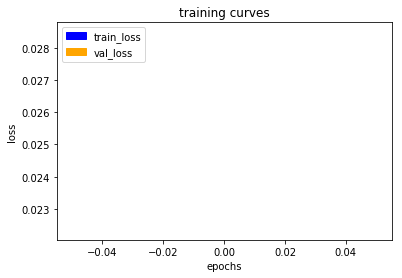

220/220 [==============================] - 11920s - loss: 0.0224 - val_loss: 0.0285
learning rate:  0.001
weights saved


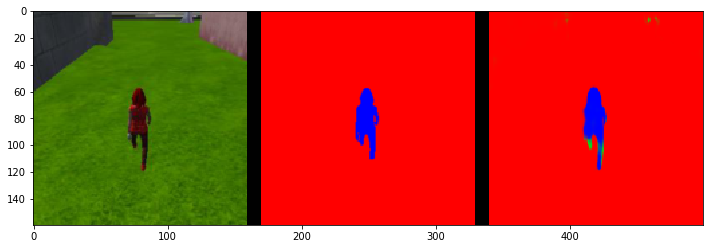

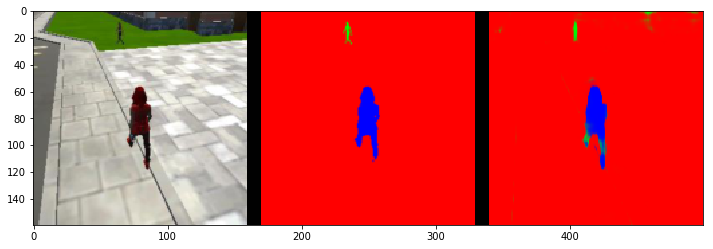

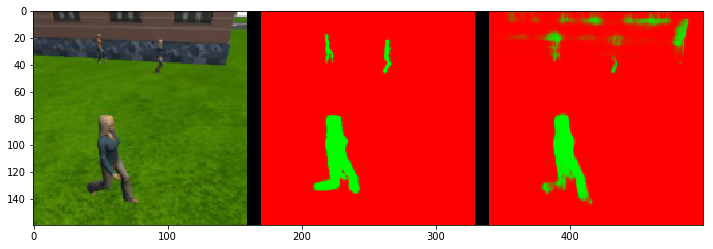

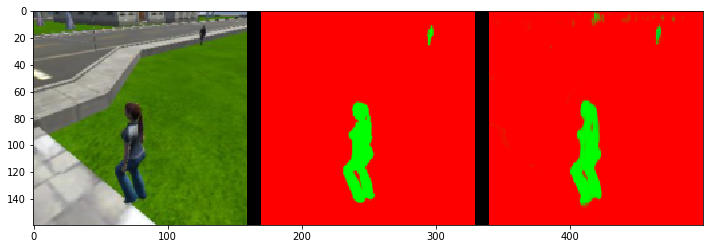

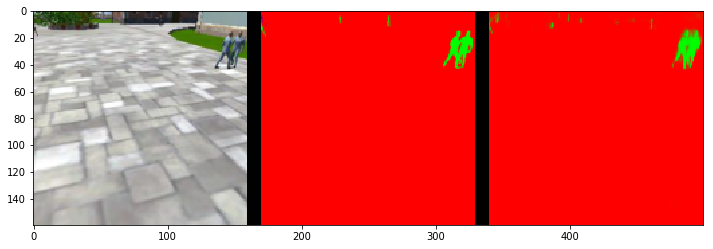

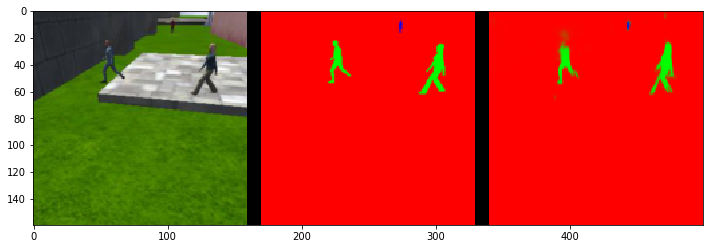

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9885893681646045
average intersection over union for other people is 0.24784251383159495
average intersection over union for the hero is 0.8121202924197433
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.81212029242
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9807321491911479
average intersection over union for other people is 0.6956004156941052
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 97, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9882440025759488
average intersection over union for other people is 0.2920971445582686
average intersection over union for the hero 

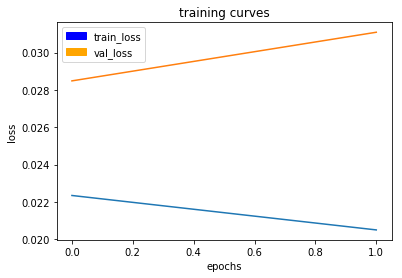

220/220 [==============================] - 11730s - loss: 0.0205 - val_loss: 0.0311
learning rate:  0.001
weights saved


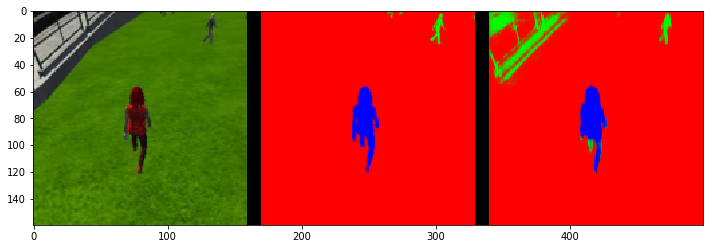

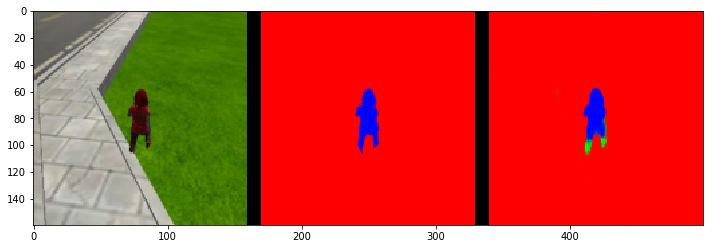

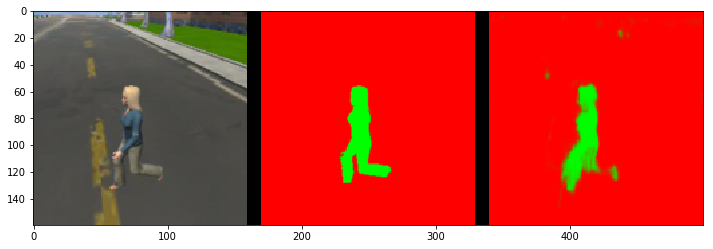

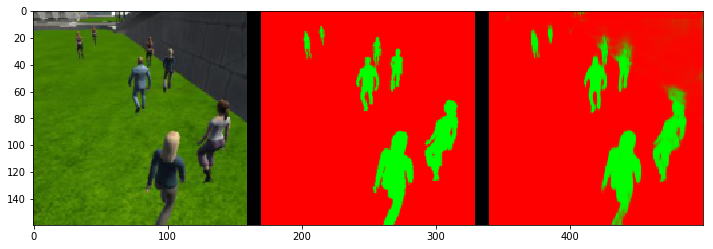

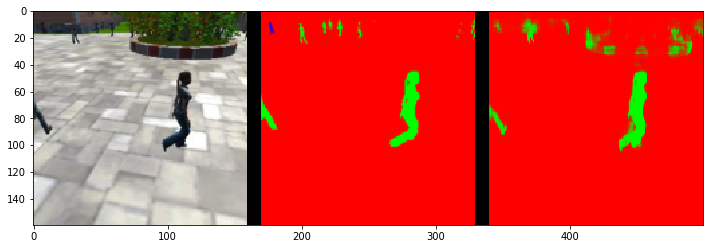

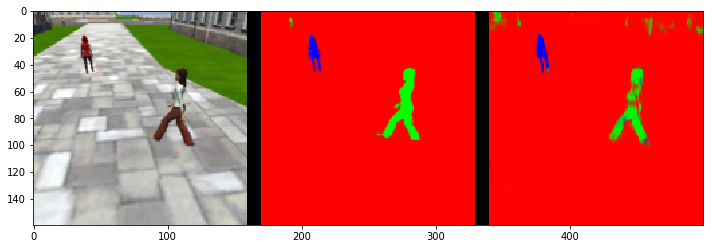

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9869380628639948
average intersection over union for other people is 0.23649668651034328
average intersection over union for the hero is 0.8008687777790442
number true positives: 538, number false positives: 0, number false negatives: 1
iou1:  0.800868777779
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9755277494900981
average intersection over union for other people is 0.671007053945299
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 48, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9834632221090478
average intersection over union for other people is 0.2803877010072592
average intersection over union for the hero 

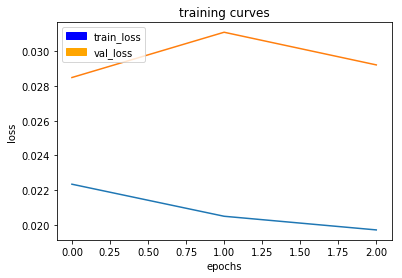

220/220 [==============================] - 11701s - loss: 0.0197 - val_loss: 0.0292
learning rate:  0.0005
weights saved


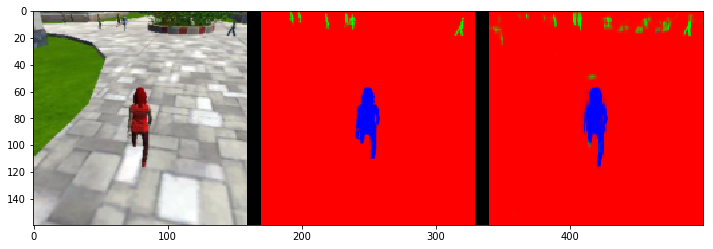

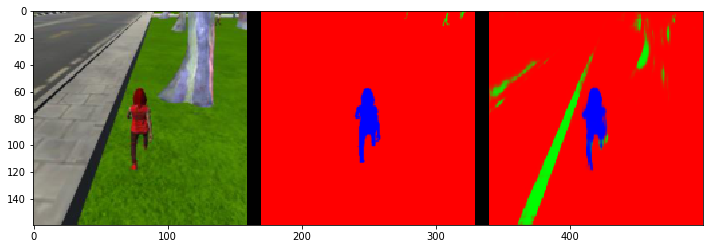

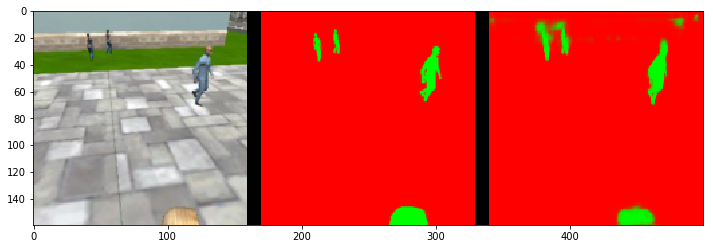

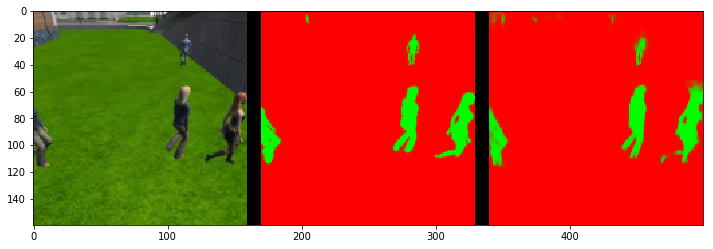

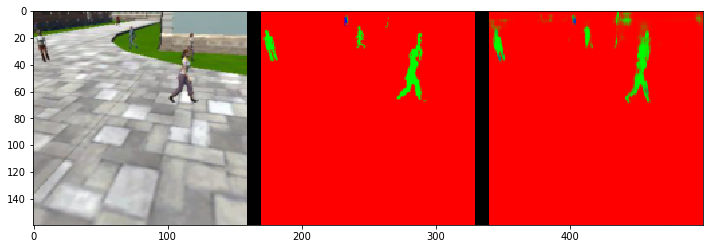

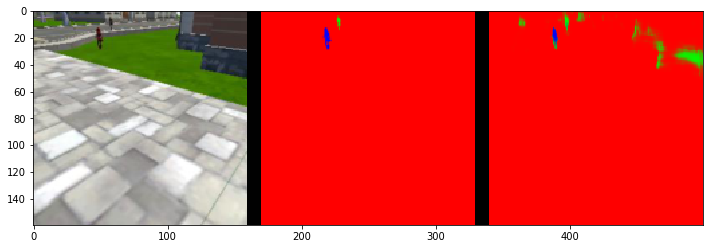

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.987615329922847
average intersection over union for other people is 0.25913389007583826
average intersection over union for the hero is 0.8371470200827653
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.837147020083
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9756412354702286
average intersection over union for other people is 0.6854957883828777
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 66, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9840221602518832
average intersection over union for other people is 0.28311797025020125
average intersection over union for the hero

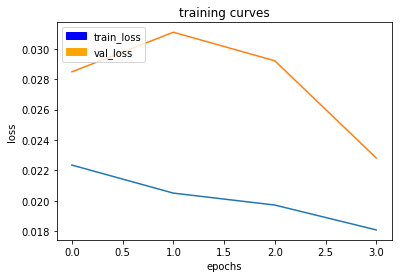

220/220 [==============================] - 11730s - loss: 0.0181 - val_loss: 0.0228
learning rate:  0.0005
weights saved


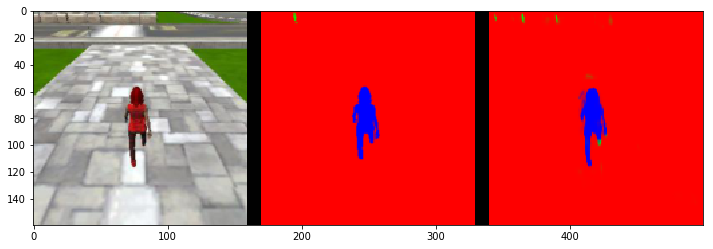

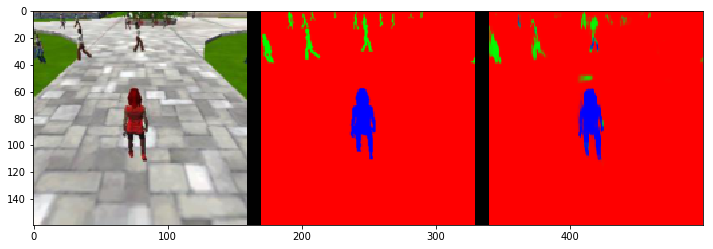

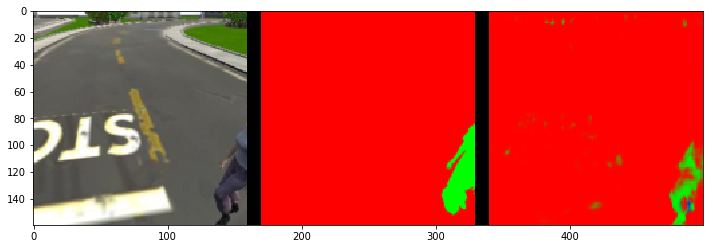

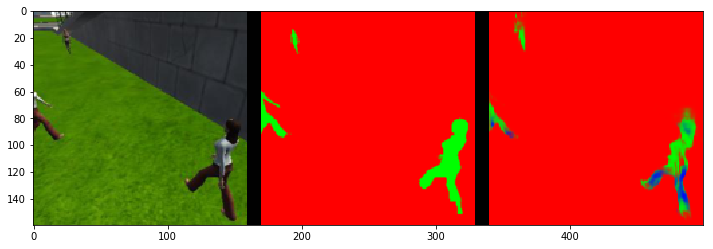

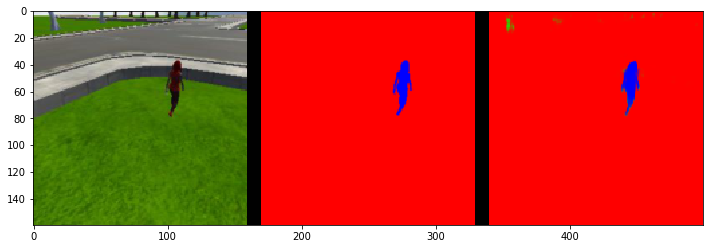

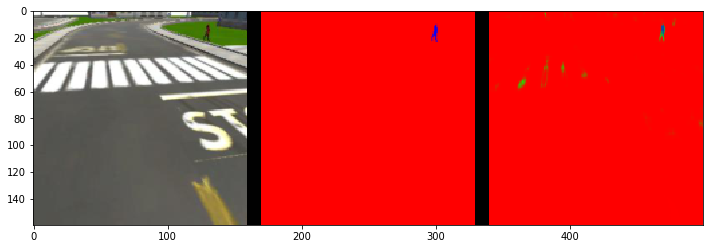

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9911021218438788
average intersection over union for other people is 0.2724161269925938
average intersection over union for the hero is 0.8581212471368389
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.858121247137
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9826604502049882
average intersection over union for other people is 0.7057818063467654
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 103, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9909591827757296
average intersection over union for other people is 0.33401499626185555
average intersection over union for the her

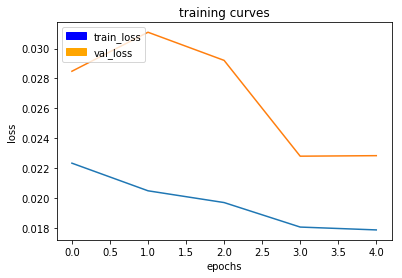

220/220 [==============================] - 11703s - loss: 0.0179 - val_loss: 0.0228
learning rate:  0.0005
weights saved


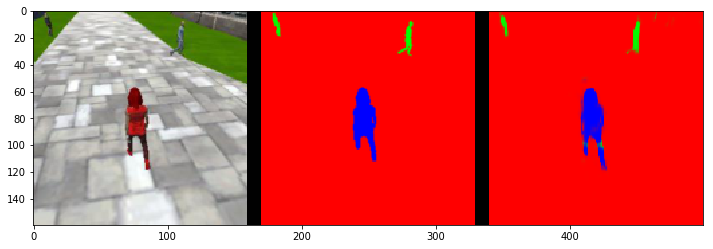

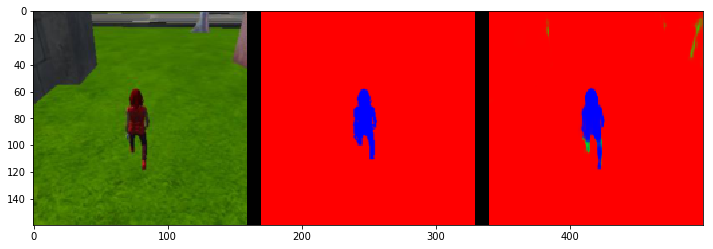

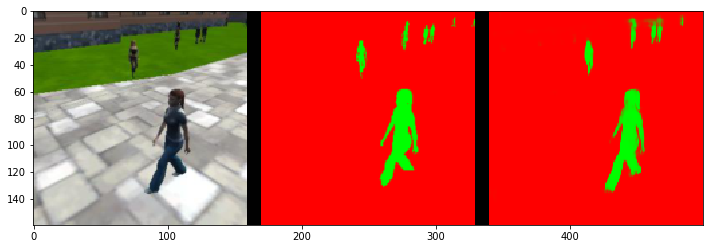

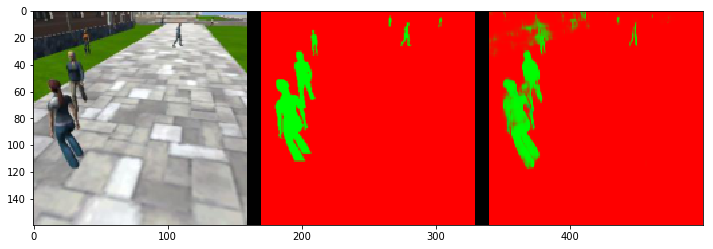

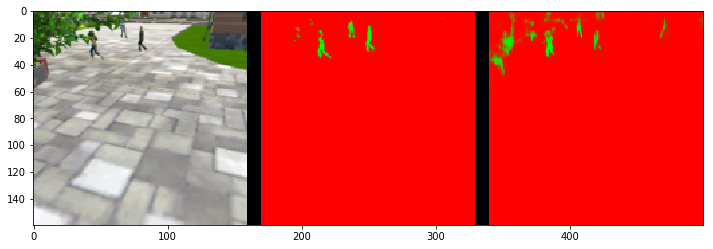

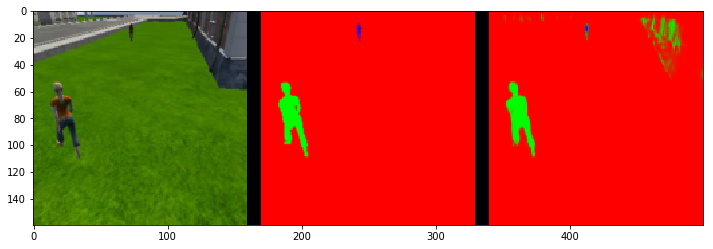

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9920548116631976
average intersection over union for other people is 0.2722975936796777
average intersection over union for the hero is 0.8302189919319649
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.830218991932
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9840859730553457
average intersection over union for other people is 0.7218614168480179
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 66, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.99168177399811
average intersection over union for other people is 0.34341968178626675
average intersection over union for the hero i

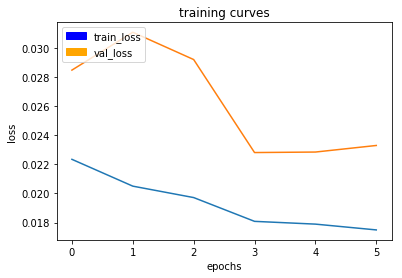

220/220 [==============================] - 11690s - loss: 0.0175 - val_loss: 0.0233
learning rate:  0.0005
weights saved


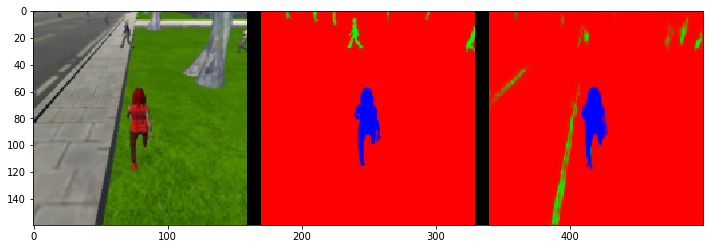

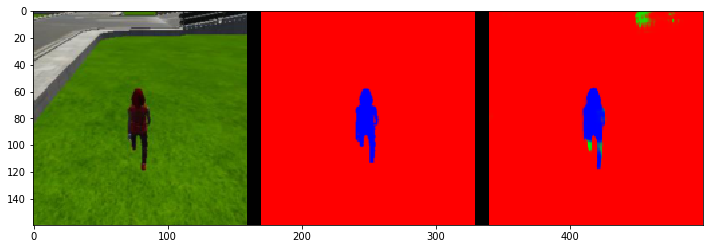

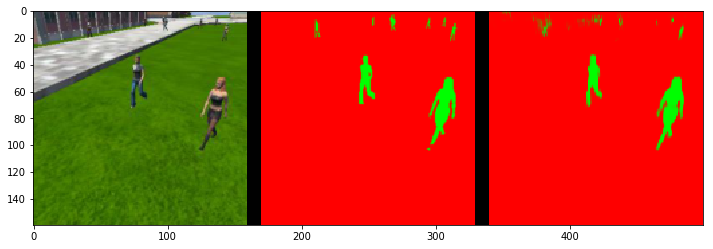

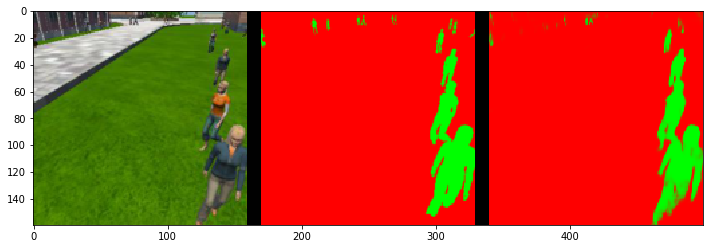

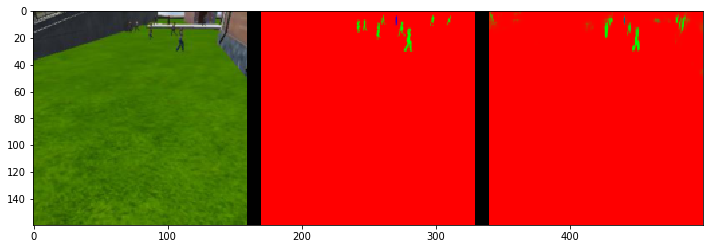

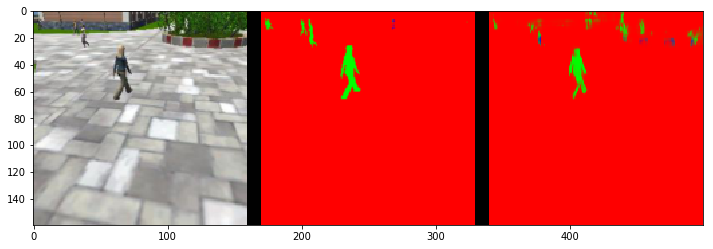

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.990428855838442
average intersection over union for other people is 0.2675952525761302
average intersection over union for the hero is 0.842766583336325
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.842766583336
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9831320140918997
average intersection over union for other people is 0.7159189234098312
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 90, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9904137538417005
average intersection over union for other people is 0.32784673218233934
average intersection over union for the hero i

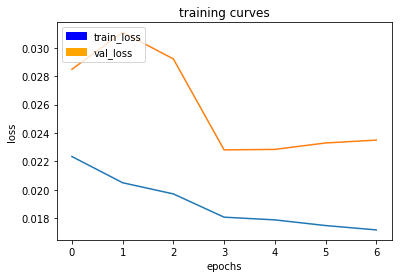

220/220 [==============================] - 11694s - loss: 0.0172 - val_loss: 0.0235
learning rate:  0.0005
weights saved


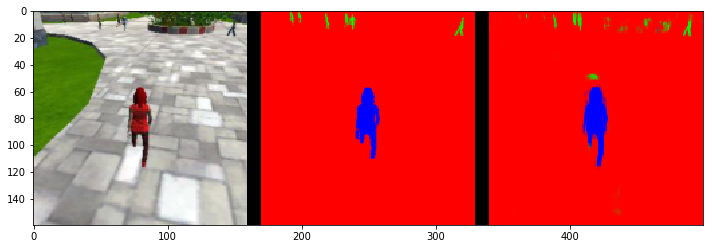

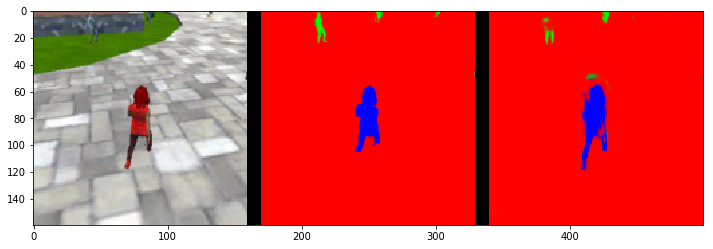

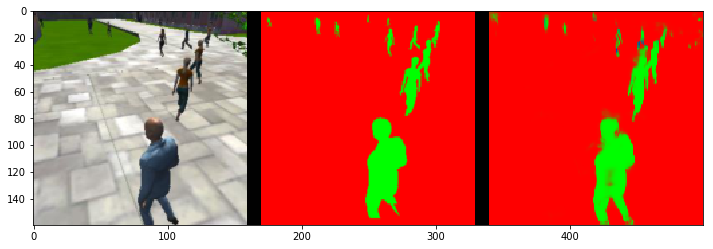

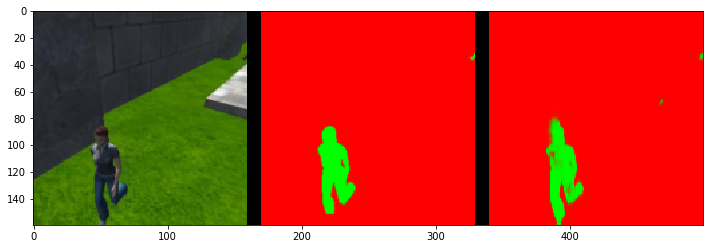

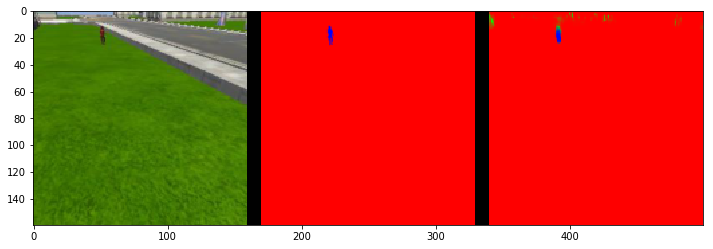

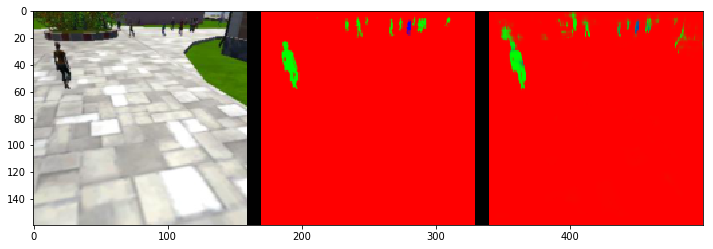

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9919491867245304
average intersection over union for other people is 0.29100586895427605
average intersection over union for the hero is 0.8519406337519948
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.851940633752
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.985229796928637
average intersection over union for other people is 0.7297248970166558
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 109, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9926893292012918
average intersection over union for other people is 0.3725442828540625
average intersection over union for the hero

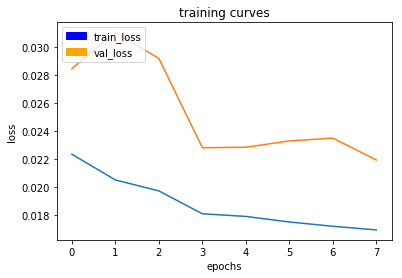

220/220 [==============================] - 11738s - loss: 0.0169 - val_loss: 0.0219
learning rate:  0.0005
weights saved


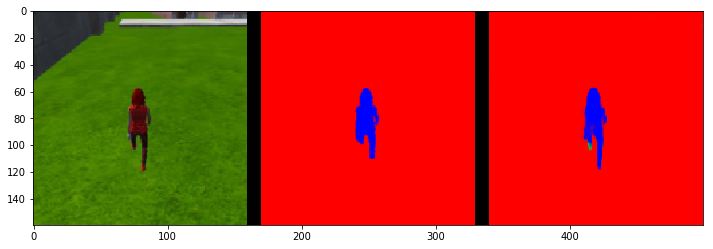

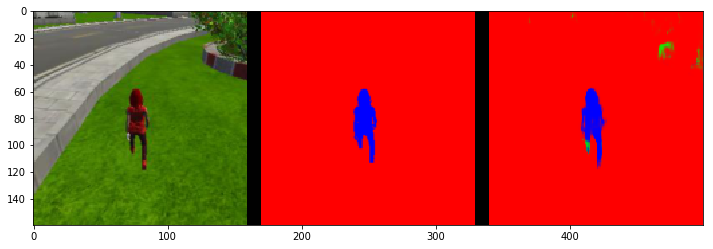

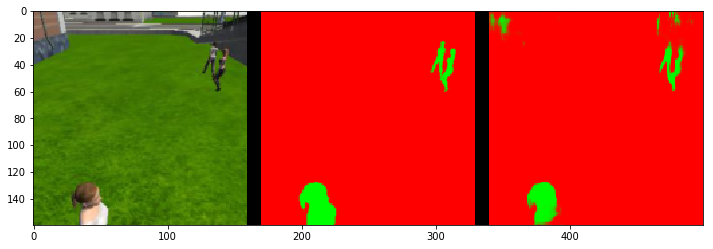

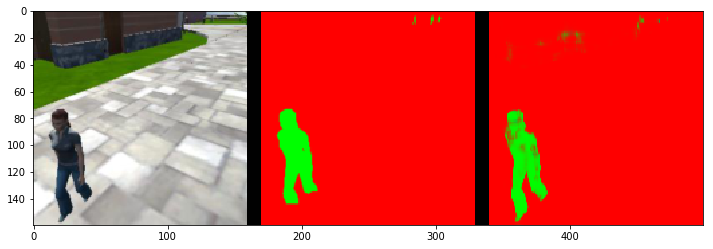

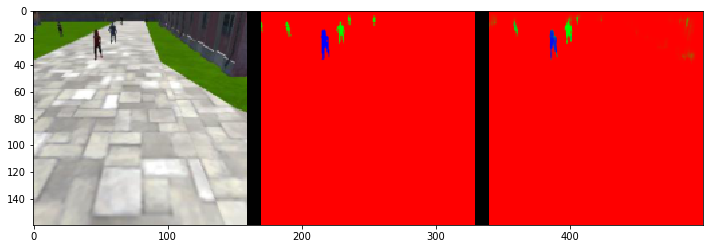

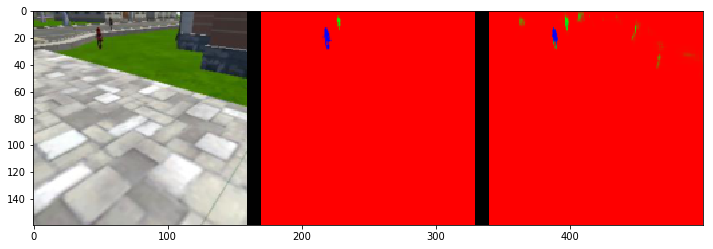

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.992336826180403
average intersection over union for other people is 0.28382936280969673
average intersection over union for the hero is 0.8618989616979841
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.861898961698
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9843864172328806
average intersection over union for other people is 0.7150821904678093
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 102, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9931409774629505
average intersection over union for other people is 0.3568573025430399
average intersection over union for the hero

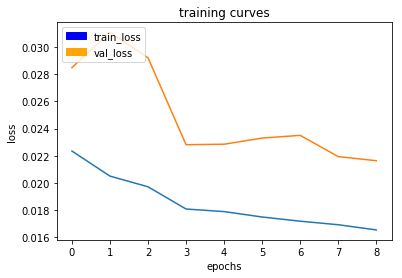

220/220 [==============================] - 11712s - loss: 0.0165 - val_loss: 0.0216
learning rate:  0.0005
weights saved


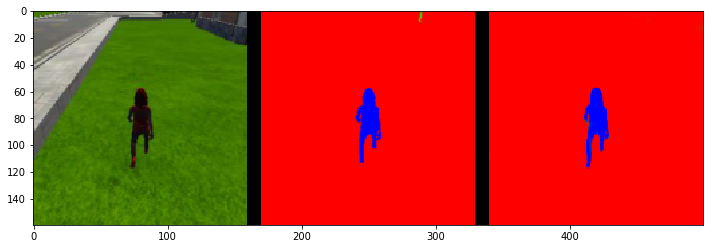

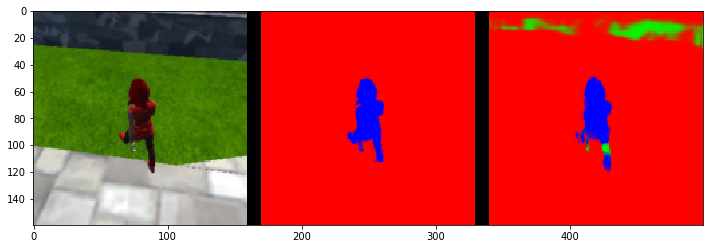

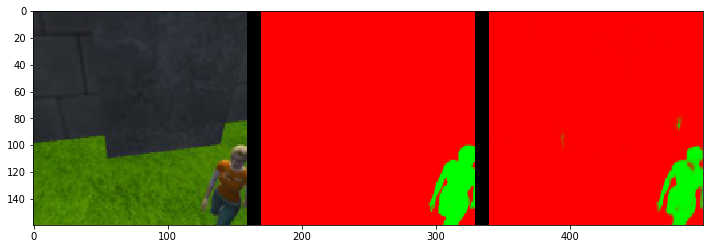

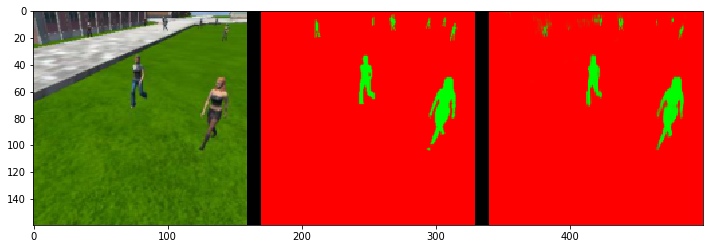

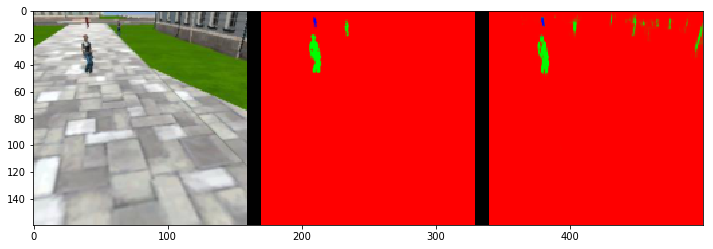

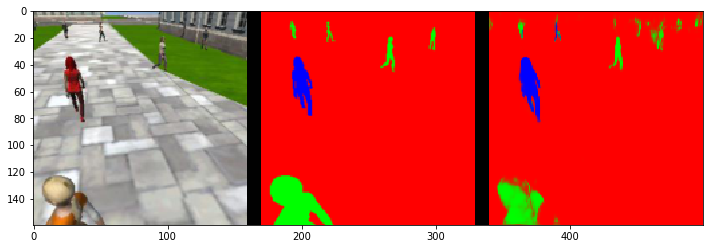

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9919685163181118
average intersection over union for other people is 0.2802398678443948
average intersection over union for the hero is 0.8689031103069811
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.868903110307
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9848488450708527
average intersection over union for other people is 0.7191379628603152
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 142, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9928167334449879
average intersection over union for other people is 0.3492758243844447
average intersection over union for the hero

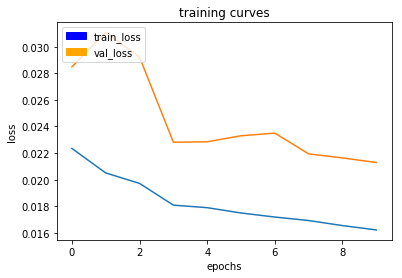

220/220 [==============================] - 11704s - loss: 0.0162 - val_loss: 0.0213


In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Define the Keras model and compile it for training
#model = models.Model(inputs=inputs, outputs=output_layer)

# load model after epoch 9 with a final score of 3.99
weight_file_name = 'model_weights_epoch9'
model = model_tools.load_network(weight_file_name)

model.compile(optimizer=keras.optimizers.Adam(learning_rate), loss='categorical_crossentropy')

# Data iterators for loading the training and validation data


train_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                               data_folder=os.path.join('..', 'data', 'train'),
                                               image_shape=image_shape,
                                               shift_aug=True)

val_iter = data_iterator.BatchIteratorSimple(batch_size=batch_size,
                                             data_folder=os.path.join('..', 'data', 'validation'),
                                             image_shape=image_shape)

logger_cb = plotting_tools.LoggerPlotter()
callbacks = [logger_cb, LRScheduler]

model.fit_generator(train_iter,
                    steps_per_epoch = steps_per_epoch, # the number of batches per epoch,
                    epochs = num_epochs, # the number of epochs to train for,
                    validation_data = val_iter, # validation iterator
                    validation_steps = validation_steps, # the number of batches to validate on
                    callbacks=callbacks,
                    workers = workers)

In [18]:
# Save your trained model weights
weight_file_name = 'model_weights_b_final'
model_tools.save_network(model, weight_file_name)

## Prediction <a id='prediction'></a>

Now that you have your model trained and saved, you can make predictions on your validation dataset. These predictions can be compared to the mask images, which are the ground truth labels, to evaluate how well your model is doing under different conditions.

There are three different predictions available from the helper code provided:
- **patrol_with_targ**: Test how well the network can detect the hero from a distance.
- **patrol_non_targ**: Test how often the network makes a mistake and identifies the wrong person as the target.
- **following_images**: Test how well the network can identify the target while following them.

In [19]:
# If you need to load a model which you previously trained you can uncomment the codeline that calls the function below.

#weight_file_name = 'model_weights'
#model = model_tools.load_network(weight_file_name)

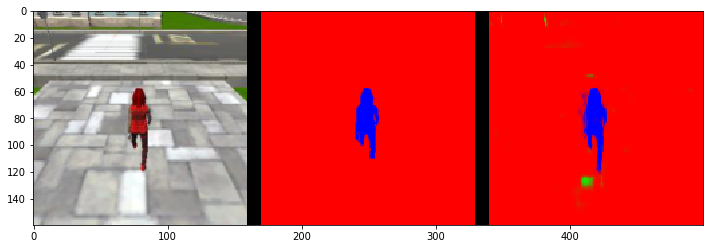

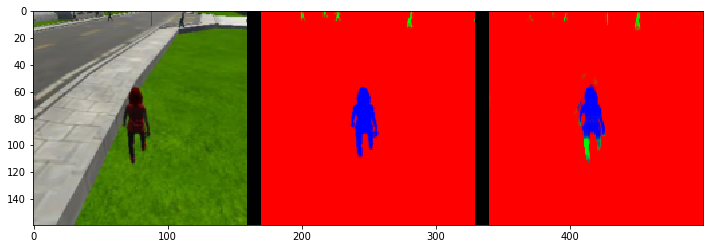

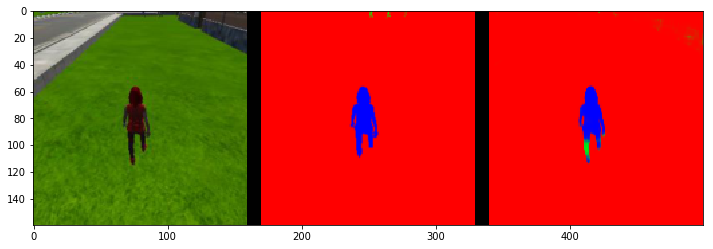

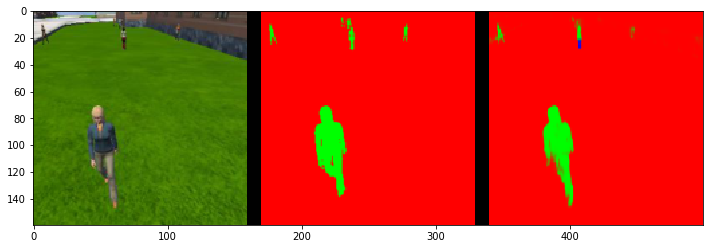

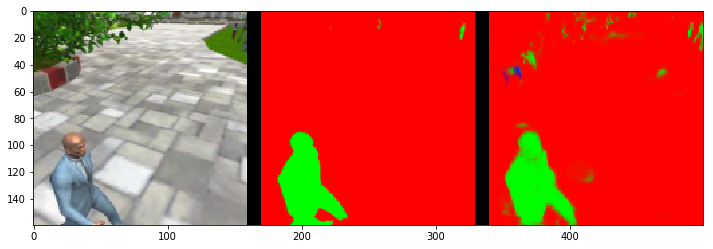

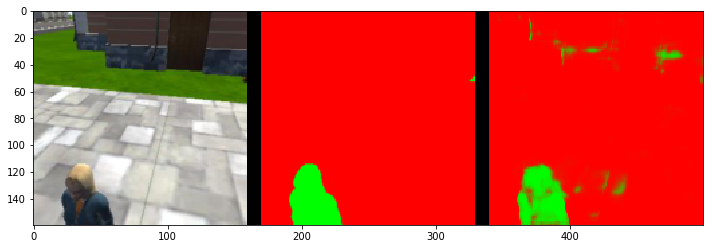

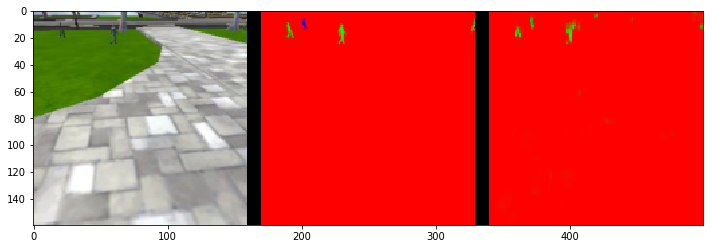

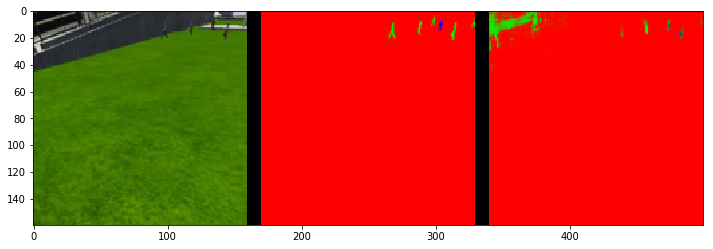

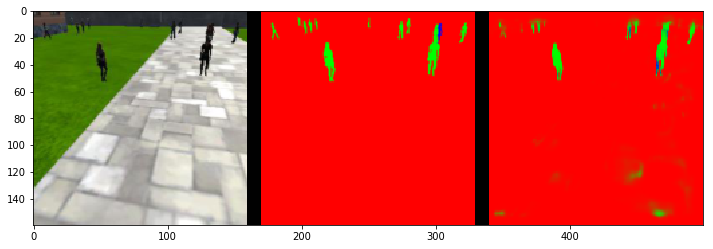

In [20]:
run_num = 'run_2'

val_with_targ, pred_with_targ = model_tools.write_predictions_grade_set(model,
                                        run_num,'patrol_with_targ', 'sample_evaluation_data') 

val_no_targ, pred_no_targ = model_tools.write_predictions_grade_set(model, 
                                        run_num,'patrol_non_targ', 'sample_evaluation_data') 

val_following, pred_following = model_tools.write_predictions_grade_set(model,
                                        run_num,'following_images', 'sample_evaluation_data')

# images while following the target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','following_images', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
    

# images while at patrol without target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_non_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)
 

   
# images while at patrol with target
im_files = plotting_tools.get_im_file_sample('sample_evaluation_data','patrol_with_targ', run_num) 
for i in range(3):
    im_tuple = plotting_tools.load_images(im_files[i])
    plotting_tools.show_images(im_tuple)



## Evaluation <a id='evaluation'></a>
Evaluate your model! The following cells include several different scores to help you evaluate your model under the different conditions discussed during the Prediction step. 

In [22]:
# Scores for while the quad is following behind the target. 
true_pos1, false_pos1, false_neg1, iou1 = scoring_utils.score_run_iou(val_following, pred_following)
print("iou1: ", iou1)

# Scores for images while the quad is on patrol and the target is not visable
true_pos2, false_pos2, false_neg2, iou2 = scoring_utils.score_run_iou(val_no_targ, pred_no_targ)
print("iou2: ", iou2)

# This score measures how well the neural network can detect the target from far away
true_pos3, false_pos3, false_neg3, iou3 = scoring_utils.score_run_iou(val_with_targ, pred_with_targ)
print("iou3: ", iou3)

# Sum all the true positives, etc from the three datasets to get a weight for the score
true_pos = true_pos1 + true_pos2 + true_pos3
false_pos = false_pos1 + false_pos2 + false_pos3
false_neg = false_neg1 + false_neg2 + false_neg3

weight = true_pos/(true_pos+false_neg+false_pos)
print("weight: ", weight)

# The IoU for the dataset that never includes the hero is excluded from grading
final_IoU = (iou1 + iou3)/2
print("final_IoU: ", final_IoU)

# And the final grade score is 
final_score = final_IoU * weight
print("final_score: ", final_score)

number of validation samples intersection over the union evaulated on 542
average intersection over union for background is 0.9902804910466508
average intersection over union for other people is 0.2661700980749906
average intersection over union for the hero is 0.8446818592008056
number true positives: 539, number false positives: 0, number false negatives: 0
iou1:  0.844681859201
number of validation samples intersection over the union evaulated on 270
average intersection over union for background is 0.9823978662559255
average intersection over union for other people is 0.7168435266378248
average intersection over union for the hero is 0.0
number true positives: 0, number false positives: 75, number false negatives: 0
iou2:  0.0
number of validation samples intersection over the union evaulated on 322
average intersection over union for background is 0.9900786324889583
average intersection over union for other people is 0.3283942724831634
average intersection over union for the hero 